In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math import *
from sklearn.cluster import KMeans
import sys
from pandas_profiling import ProfileReport

Considerações Iniciais:
Usar o K-Means para separar os herois em 3 categorias (ou clusters) diferentes em NLP e Numérico

In [2]:
data = pd.read_csv('superheroes_nlp_dataset.csv')

**Descrição dos Dados de todo o Dataset**

In [3]:
profile = ProfileReport(data, title='Pandas Profiling Report', explorative=True)
profile

In [4]:
def calculate_wcss(data):
    wcss = []
    for n in range(2, 21):
        kmeans = KMeans(n_clusters=n)
        kmeans.fit(X=data)
        wcss.append(kmeans.inertia_)

    return wcss

**Prévia do Dataset**

In [5]:
data.head()

,name,real_name,full_name,overall_score,history_text,powers_text,intelligence_score,strength_score,speed_score,durability_score,...,has_flight,has_accelerated_healing,has_weapons_master,has_intelligence,has_reflexes,has_super_speed,has_durability,has_stamina,has_agility,has_super_strength
0,3-D Man,"Delroy Garrett, Jr.","Delroy Garrett, Jr.",6,"Delroy Garrett, Jr. grew up to become a track ...",NaN,85,30,60,60,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,514A (Gotham),Bruce Wayne,NaN,10,He was one of the many prisoners of Indian Hil...,NaN,100,20,30,50,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,A-Bomb,Richard Milhouse Jones,Richard Milhouse Jones,20,"Richard ""Rick"" Jones was orphaned at a young ...","On rare occasions, and through unusual circu...",80,100,80,100,...,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0
3,Aa,Aa,NaN,12,Aa is one of the more passive members of the P...,NaN,80,50,55,45,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Aaron Cash,Aaron Cash,Aaron Cash,5,Aaron Cash is the head of security at Arkham A...,NaN,80,10,25,40,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
data.columns

Index(['name', 'real_name', 'full_name', 'overall_score', 'history_text',
       'powers_text', 'intelligence_score', 'strength_score', 'speed_score',
       'durability_score', 'power_score', 'combat_score', 'superpowers',
       'alter_egos', 'aliases', 'place_of_birth', 'first_appearance',
       'creator', 'alignment', 'occupation', 'base', 'teams', 'relatives',
       'gender', 'type_race', 'height', 'weight', 'eye_color', 'hair_color',
       'skin_color', 'img', 'has_electrokinesis', 'has_energy_constructs',
       'has_mind_control_resistance', 'has_matter_manipulation',
       'has_telepathy_resistance', 'has_mind_control', 'has_enhanced_hearing',
       'has_dimensional_travel', 'has_element_control', 'has_size_changing',
       'has_fire_resistance', 'has_fire_control', 'has_dexterity',
       'has_reality_warping', 'has_illusions', 'has_energy_beams',
       'has_peak_human_condition', 'has_shapeshifting', 'has_heat_resistance',
       'has_jump', 'has_self-sustenance', 'ha

**Inicialmente trabalharemos apenas com 6 colunas das 81 disponíveis**

Análise numérica de scores

In [7]:
short_data = data[["intelligence_score","strength_score","speed_score","durability_score","power_score","combat_score"]]

In [8]:
short_data.describe()

,intelligence_score,strength_score,speed_score,durability_score,power_score,combat_score
count,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000
mean,79.103448,39.458621,46.389655,56.193103,66.913793,68.175862
std,25.048393,34.385566,29.205902,31.647711,33.225127,29.540420
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,75.000000,10.000000,25.000000,30.000000,40.000000,55.000000
50%,85.000000,30.000000,40.000000,55.000000,72.500000,75.000000
75%,95.000000,65.000000,65.000000,85.000000,100.000000,90.000000
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


**Utilizando modelo PCA**

In [9]:
from sklearn.decomposition import PCA

# Apply PCA by fitting the good data with the same number of dimensions as features
pca = PCA(n_components=6)
pca.fit(short_data)

#Components PCA
print(pca.components_)

[[-0.25691853 -0.47127043 -0.40727426 -0.46938034 -0.46053678 -0.33706483]
 [-0.52817051  0.53325932  0.10120459  0.18595451 -0.07523418 -0.62144089]
 [-0.07582368 -0.31782594 -0.19693964 -0.0469491   0.85116253 -0.35744979]
 [-0.22728389 -0.36747115  0.86957063 -0.23327954  0.0092559  -0.05146743]
 [ 0.76341395 -0.01153324  0.16820184  0.02881189 -0.14969512 -0.60459532]
 [ 0.12174038  0.50730395  0.02559589 -0.82924624  0.18781304  0.06514419]]


Variância

In [10]:
print(pca.explained_variance_)

[3696.86344297  802.74340885  417.59671864  275.65687564  239.77091469
  208.2655717 ]


**K-MEANS**

In [11]:
import seaborn as sb
import matplotlib.pyplot as plt

%matplotlib inline
print("a")

a


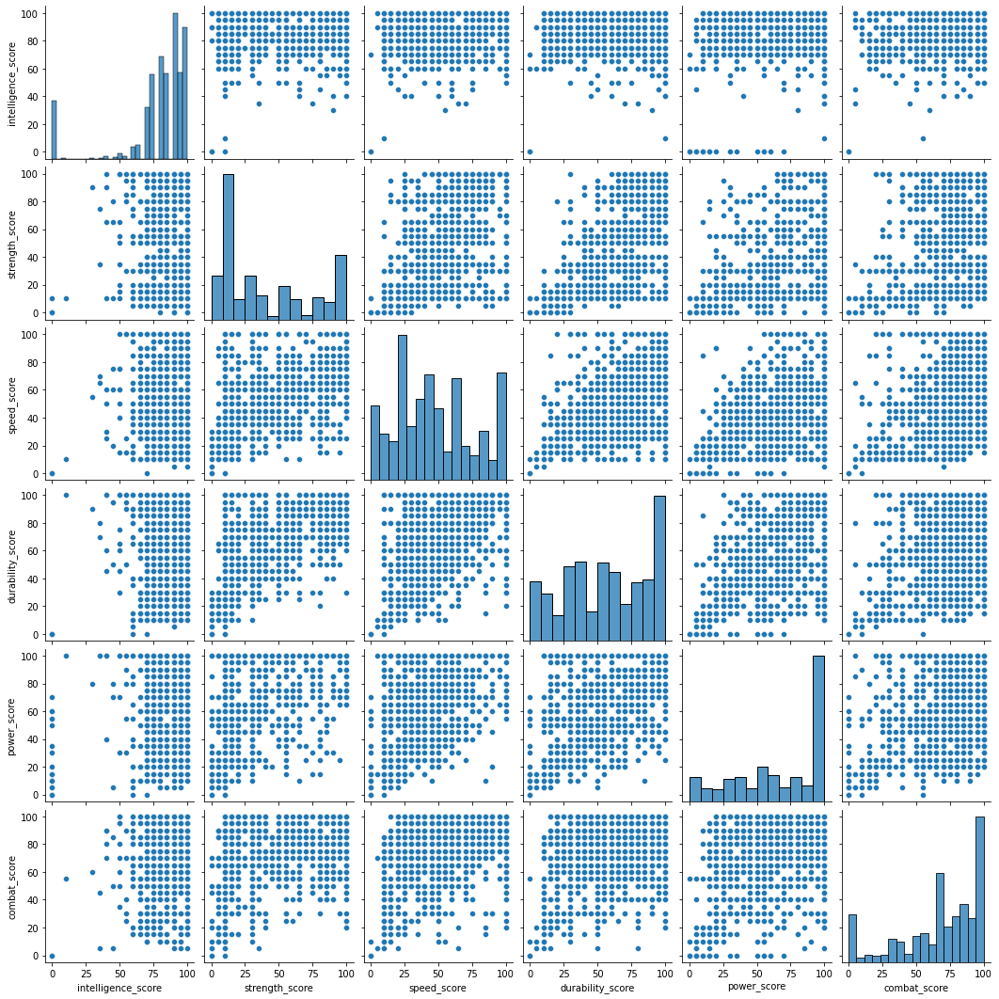

In [12]:
sb.pairplot(short_data)
plt.show()

In [13]:
X = np.array(short_data)

In [14]:
X

array([[ 85,  30,  60,  60,  40,  70],
       [100,  20,  30,  50,  35, 100],
       [ 80, 100,  80, 100, 100,  80],
       ...,
       [ 95,  50, 100,  75, 100,  80],
       [ 75,  10, 100,  30, 100,  30],
       [ 45,  80,  75,  95,  80,  50]], dtype=int64)

In [15]:
np.set_printoptions(threshold=sys.maxsize)

**Teste**

In [16]:
k=calculate_wcss(X)

In [17]:
print(k)

[4714430.987251271, 3130166.6321322573, 2513029.0048552477, 2215933.467592287, 1973565.2024643845, 1780964.6955751195, 1641603.6179354556, 1548690.6626554844, 1471970.9209862691, 1410158.7188651366, 1342674.7574808355, 1294978.0469025073, 1254313.8114557543, 1214804.4951747993, 1177149.1929292246, 1143174.8715809942, 1113475.381439091, 1075763.899733592, 1051411.3187015636]


In [18]:
def optimal_number_of_clusters(wcss):
    x1, y1 = 2, wcss[0]
    x2, y2 = 20, wcss[len(wcss)-1]

    distances = []
    for i in range(len(wcss)):
        x0 = i+2
        y0 = wcss[i]
        numerator = abs((y2-y1)*x0 - (x2-x1)*y0 + x2*y1 - y2*x1)
        denominator = sqrt((y2 - y1)**2 + (x2 - x1)**2)
        distances.append(numerator/denominator)
    
    return distances.index(max(distances)) + 2

In [19]:
number = optimal_number_of_clusters(k)

In [20]:
number

6

In [21]:
kmeans = KMeans(n_clusters=6,random_state=0)

In [22]:
kmeans.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=6, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [23]:
predict = kmeans.predict(X)
print(predict)

[4 4 2 3 5 4 3 0 2 3 3 2 3 0 3 2 0 3 3 4 4 0 5 4 5 4 5 4 3 4 2 4 0 4 4 0 5
 5 0 0 2 3 3 2 5 4 2 2 1 5 0 0 2 1 5 3 5 5 3 2 0 4 0 5 3 5 2 2 0 2 5 0 3 0
 2 2 0 4 3 5 0 0 2 5 5 3 2 0 5 3 5 4 4 4 4 3 3 2 3 5 4 1 4 0 3 4 0 3 3 3 2
 2 4 0 0 4 4 5 4 3 4 0 5 4 4 4 4 4 4 5 3 3 4 3 4 3 4 4 4 4 4 0 0 4 4 1 3 3
 4 4 2 2 0 2 2 0 5 4 5 1 2 5 1 1 4 3 3 3 2 2 1 2 2 2 2 3 2 3 4 4 4 3 4 3 4
 4 1 3 2 4 3 4 3 3 3 4 4 4 5 5 4 3 5 4 5 3 1 0 0 0 0 3 1 0 3 3 0 1 5 4 0 2
 1 5 3 5 0 4 3 5 5 4 4 4 4 4 0 1 2 5 0 3 0 3 3 2 3 4 0 4 4 3 4 3 3 4 2 4 4
 4 0 4 5 1 5 2 0 4 2 4 3 4 2 3 4 4 4 4 2 1 0 1 4 1 2 4 5 2 4 4 5 4 5 3 0 1
 1 0 0 0 3 3 3 5 4 1 3 0 1 3 4 0 0 3 3 3 4 4 3 4 5 1 0 2 2 3 5 1 4 4 4 5 0
 1 1 0 2 2 0 5 4 3 5 5 4 3 5 3 1 2 3 5 3 4 1 5 2 2 3 5 3 3 3 3 3 5 5 4 3 5
 3 4 4 4 4 4 2 3 3 4 3 3 3 3 4 3 3 0 2 2 0 0 2 2 3 5 2 0 1 3 4 2 4 4 4 4 3
 3 4 4 0 2 0 2 2 0 2 0 4 4 0 2 0 5 4 3 3 5 5 4 3 2 0 4 3 0 3 3 4 4 4 5 0 5
 3 3 2 1 2 3 2 4 0 4 3 3 3 0 0 3 1 3 4 2 0 3 0 2 2 2 1 3 0 4 0 3 5 0 5 3 3
 0 2 1 3 5 3 3 3 1 3 5 5 

In [24]:
short_data["k-classes"] = kmeans.labels_
short_data["name"] = data["name"]

D:\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
D:\Anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [25]:
short_data.head(20)

,intelligence_score,strength_score,speed_score,durability_score,power_score,combat_score,k-classes,name
0,85,30,60,60,40,70,4,3-D Man
1,100,20,30,50,35,100,4,514A (Gotham)
2,80,100,80,100,100,80,2,A-Bomb
3,80,50,55,45,100,55,3,Aa
4,80,10,25,40,30,50,5,Aaron Cash
5,90,40,45,55,55,85,4,Aayla Secura
6,95,30,35,65,100,85,3,Abe Sapien
7,75,90,55,65,100,65,0,Abin Sur
8,85,100,80,90,100,95,2,Abomination
9,100,10,20,30,100,55,3,Abra Kadabra (CW)


Hmk

**Aplicação com NLP**

In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
import nltk

In [27]:
text_data = data[["name","real_name","full_name","history_text","powers_text"]]
from sklearn.feature_extraction.text import TfidfTransformer,TfidfVectorizer,CountVectorizer

In [28]:
text_data.head()

,name,real_name,full_name,history_text,powers_text
0,3-D Man,"Delroy Garrett, Jr.","Delroy Garrett, Jr.","Delroy Garrett, Jr. grew up to become a track ...",NaN
1,514A (Gotham),Bruce Wayne,NaN,He was one of the many prisoners of Indian Hil...,NaN
2,A-Bomb,Richard Milhouse Jones,Richard Milhouse Jones,"Richard ""Rick"" Jones was orphaned at a young ...","On rare occasions, and through unusual circu..."
3,Aa,Aa,NaN,Aa is one of the more passive members of the P...,NaN
4,Aaron Cash,Aaron Cash,Aaron Cash,Aaron Cash is the head of security at Arkham A...,NaN


**Seleção de Stopwords, Remoção de Missing Data e Aplicação de Lowercase**

In [29]:
nltk.download('stopwords')
stopwords = nltk.corpus.stopwords.words('english')
text_data = text_data.fillna('').astype(str).apply(lambda x: x.str.lower())


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\victo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


**Preview de Dataset**

In [30]:
text_data.head(10)

,name,real_name,full_name,history_text,powers_text
0,3-d man,"delroy garrett, jr.","delroy garrett, jr.","delroy garrett, jr. grew up to become a track ...",
1,514a (gotham),bruce wayne,,he was one of the many prisoners of indian hil...,
2,a-bomb,richard milhouse jones,richard milhouse jones,"richard ""rick"" jones was orphaned at a young ...","on rare occasions, and through unusual circu..."
3,aa,aa,,aa is one of the more passive members of the p...,
4,aaron cash,aaron cash,aaron cash,aaron cash is the head of security at arkham a...,
5,aayla secura,aayla secura,,ayla secura was a rutian twi'lek jedi knight (...,
6,abe sapien,abraham sapien,abraham sapien,"sapien began life as langdon everett caul, a ...",abe is a humanoid amphibious creature. he has...
7,abin sur,,,originally a history professor on the planet ...,abin sur possessed an exceptionally strong s...
8,abomination,emil blonsky,emil blonsky,"formerly known as emil blonsky, a spy of sovie...",'blonsky''s transformation into the abominatio...
9,abra kadabra (cw),unknown,unknown,"""abra kadabra"" was a criminal time traveler fr...",abra kadabra was augmented with various nanot...


**Compilado das colunas de texto**

In [31]:
text_data["comp"] = text_data["name"] + " " + text_data["real_name"] + " " + text_data["full_name"] + " " + text_data["history_text"] + " " + text_data["powers_text"]

**Vetorização e remoção de stopwords**

In [32]:
vec = TfidfVectorizer(stop_words=stopwords)
vec.fit(text_data.comp.values)
features = vec.transform(text_data.comp.values)

In [33]:
print(features)

  (0, 30759)	0.04110477166511444
  (0, 30338)	0.08779223074772098
  (0, 30070)	0.053193262248455976
  (0, 29923)	0.1449963873775915
  (0, 29825)	0.289992774755183
  (0, 29607)	0.07321192828988521
  (0, 29211)	0.11220902442148872
  (0, 29008)	0.10139519670167409
  (0, 27542)	0.15318295391372122
  (0, 27365)	0.0708552001303067
  (0, 27122)	0.10301130358485029
  (0, 27009)	0.0965815452496764
  (0, 23723)	0.11119787012098001
  (0, 21931)	0.0745866713924988
  (0, 21849)	0.10669247744128552
  (0, 20201)	0.03244037622561983
  (0, 20155)	0.09784386610554086
  (0, 19946)	0.08027650855695151
  (0, 19826)	0.12281479291054803
  (0, 19580)	0.10570737683140717
  (0, 19566)	0.05326473332270717
  (0, 19228)	0.07120034626814901
  (0, 18103)	0.12788897129845062
  (0, 17595)	0.0810501972490704
  (0, 17151)	0.05475000255727349
  :	:
  (1449, 2908)	0.01995331934475592
  (1449, 2821)	0.09533525391043048
  (1449, 2676)	0.006072163954874463
  (1449, 2627)	0.018333017676493448
  (1449, 2611)	0.0113269699243454

**Predição por K-Means**

In [34]:
#km=calculate_wcss(features)
#number = optimal_number_of_clusters(km)

In [35]:
km = KMeans(n_clusters=3, init='k-means++', n_init=10, max_iter=1000, tol=0.0001, precompute_distances=True, verbose=0, random_state=None, n_jobs=1)

km.fit(features)

predicted = km.predict(features)

In [36]:
predicted

array([0, 2, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 2, 2, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 0, 0, 1, 0, 1, 0, 0, 2, 1, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [37]:
text_data["k-classes"] = predicted

In [38]:
text_data.head(10)

,name,real_name,full_name,history_text,powers_text,comp,k-classes
0,3-d man,"delroy garrett, jr.","delroy garrett, jr.","delroy garrett, jr. grew up to become a track ...",,"3-d man delroy garrett, jr. delroy garrett, jr...",0
1,514a (gotham),bruce wayne,,he was one of the many prisoners of indian hil...,,514a (gotham) bruce wayne he was one of the m...,2
2,a-bomb,richard milhouse jones,richard milhouse jones,"richard ""rick"" jones was orphaned at a young ...","on rare occasions, and through unusual circu...",a-bomb richard milhouse jones richard milhouse...,1
3,aa,aa,,aa is one of the more passive members of the p...,,aa aa aa is one of the more passive members o...,0
4,aaron cash,aaron cash,aaron cash,aaron cash is the head of security at arkham a...,,aaron cash aaron cash aaron cash aaron cash is...,0
5,aayla secura,aayla secura,,ayla secura was a rutian twi'lek jedi knight (...,,aayla secura aayla secura ayla secura was a r...,0
6,abe sapien,abraham sapien,abraham sapien,"sapien began life as langdon everett caul, a ...",abe is a humanoid amphibious creature. he has...,abe sapien abraham sapien abraham sapien sapi...,0
7,abin sur,,,originally a history professor on the planet ...,abin sur possessed an exceptionally strong s...,abin sur originally a history professor on ...,0
8,abomination,emil blonsky,emil blonsky,"formerly known as emil blonsky, a spy of sovie...",'blonsky''s transformation into the abominatio...,abomination emil blonsky emil blonsky formerly...,1
9,abra kadabra (cw),unknown,unknown,"""abra kadabra"" was a criminal time traveler fr...",abra kadabra was augmented with various nanot...,"abra kadabra (cw) unknown unknown ""abra kadabr...",0


In [39]:
data_comp = pd.DataFrame(columns = ['nlp', 'nbr']) 
data_comp["nlp"] = text_data["k-classes"]
data_comp["nbr"] = short_data["k-classes"]

In [40]:
data_comp.head(20)

,nlp,nbr
0,0,4
1,2,4
2,1,2
3,0,3
4,0,5
5,0,4
6,0,3
7,0,0
8,1,2
9,0,3


In [42]:
from sklearn import preprocessing
df = data.copy()
# Get dataset
df = df.select_dtypes(['number'])
df

,intelligence_score,strength_score,speed_score,durability_score,power_score,combat_score,has_electrokinesis,has_energy_constructs,has_mind_control_resistance,has_matter_manipulation,...,has_flight,has_accelerated_healing,has_weapons_master,has_intelligence,has_reflexes,has_super_speed,has_durability,has_stamina,has_agility,has_super_strength
0,85,30,60,60,40,70,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,100,20,30,50,35,100,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,80,100,80,100,100,80,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0
3,80,50,55,45,100,55,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,80,10,25,40,30,50,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1445,90,10,25,30,100,55,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1446,80,100,100,100,100,80,0.0,0.0,0.0,1.0,...,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1447,95,50,100,75,100,80,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1448,75,10,100,30,100,30,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [43]:
# Normalize total_bedrooms column
df = df.fillna(0)
x_array = np.array(df)
x_array.shape

(1450, 56)

In [44]:
normalized_X = preprocessing.normalize(x_array)

In [45]:
normalized_X

array([[0.57533647, 0.20305993, 0.40611986, 0.40611986, 0.27074657,
        0.4738065 , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.00676866, 0.        , 0.        , 0.        ,
        0.00676866],
       [0.63210165, 0.12642033, 0.1896305 , 0.31605083, 0.22123558,
        0.63210165, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.     

In [46]:
k2=calculate_wcss(normalized_X)

In [47]:
number = optimal_number_of_clusters(k2)
number

6

In [48]:
kme = KMeans(n_clusters=6,random_state=0)
kme.fit(normalized_X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=6, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [49]:
predicted = kme.predict(normalized_X)

In [50]:
predicted

array([0, 0, 5, 2, 0, 0, 2, 5, 5, 2, 2, 5, 2, 5, 2, 5, 5, 0, 2, 0, 0, 5,
       3, 0, 3, 0, 0, 0, 2, 0, 5, 0, 5, 2, 0, 5, 3, 0, 5, 5, 5, 2, 2, 5,
       3, 2, 5, 5, 4, 5, 5, 5, 5, 1, 5, 2, 2, 2, 2, 5, 5, 0, 5, 3, 2, 3,
       5, 5, 5, 5, 3, 5, 5, 5, 5, 5, 5, 0, 2, 5, 5, 5, 5, 2, 0, 2, 5, 5,
       3, 2, 0, 0, 0, 0, 0, 2, 2, 5, 2, 2, 0, 1, 0, 5, 2, 0, 5, 2, 2, 0,
       5, 5, 0, 5, 5, 0, 2, 5, 0, 2, 0, 2, 3, 0, 0, 0, 0, 0, 0, 2, 2, 2,
       0, 2, 0, 2, 0, 0, 0, 0, 0, 5, 5, 0, 0, 4, 2, 2, 0, 2, 5, 5, 5, 5,
       5, 5, 0, 0, 5, 1, 5, 0, 4, 4, 0, 2, 2, 2, 5, 5, 4, 5, 5, 5, 5, 2,
       5, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 2, 5, 0, 2, 2, 2, 2, 2, 0, 0, 0,
       0, 2, 0, 2, 2, 2, 2, 2, 1, 5, 5, 5, 5, 2, 4, 5, 5, 5, 5, 4, 3, 2,
       5, 5, 1, 5, 2, 3, 5, 0, 2, 3, 3, 0, 5, 0, 0, 0, 5, 4, 5, 0, 5, 2,
       5, 2, 2, 5, 2, 0, 5, 0, 0, 5, 0, 0, 2, 0, 5, 0, 0, 0, 5, 0, 3, 4,
       3, 5, 5, 0, 5, 0, 2, 0, 5, 2, 0, 0, 0, 0, 5, 1, 5, 4, 2, 1, 5, 2,
       0, 5, 0, 0, 3, 0, 0, 2, 5, 1, 4, 5, 5, 5, 2,